<a href="https://colab.research.google.com/github/qingbear/myfirst/blob/master/transformer_demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

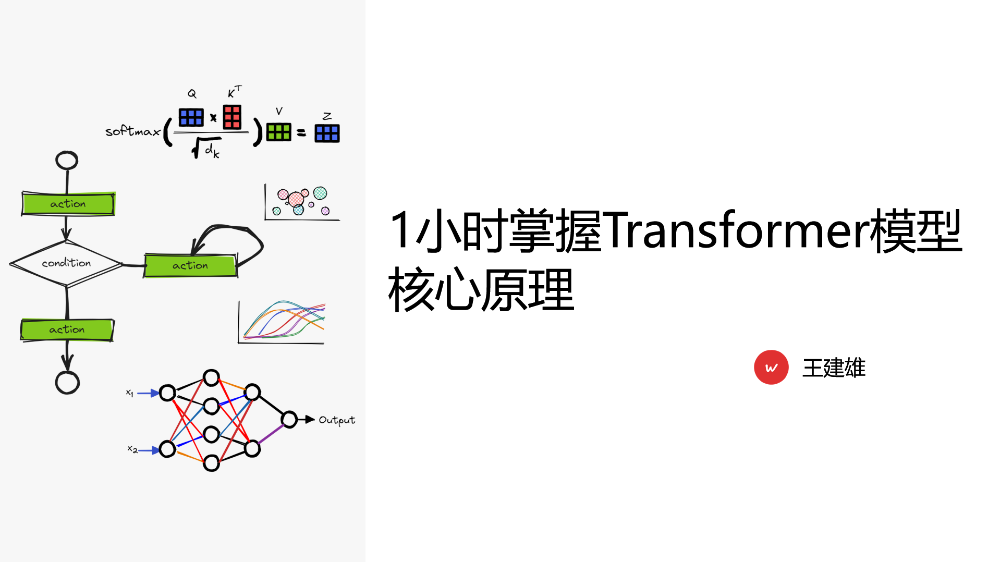

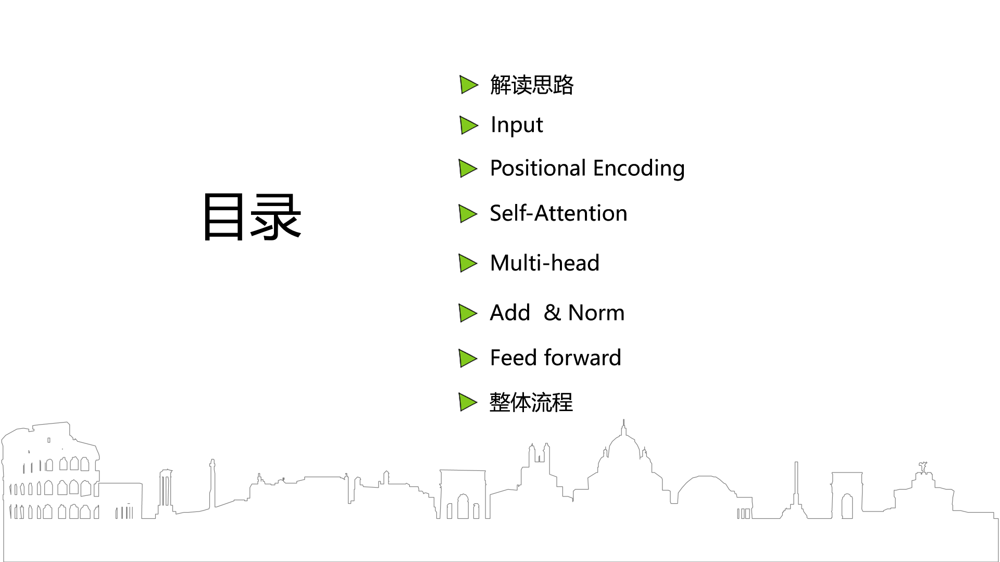

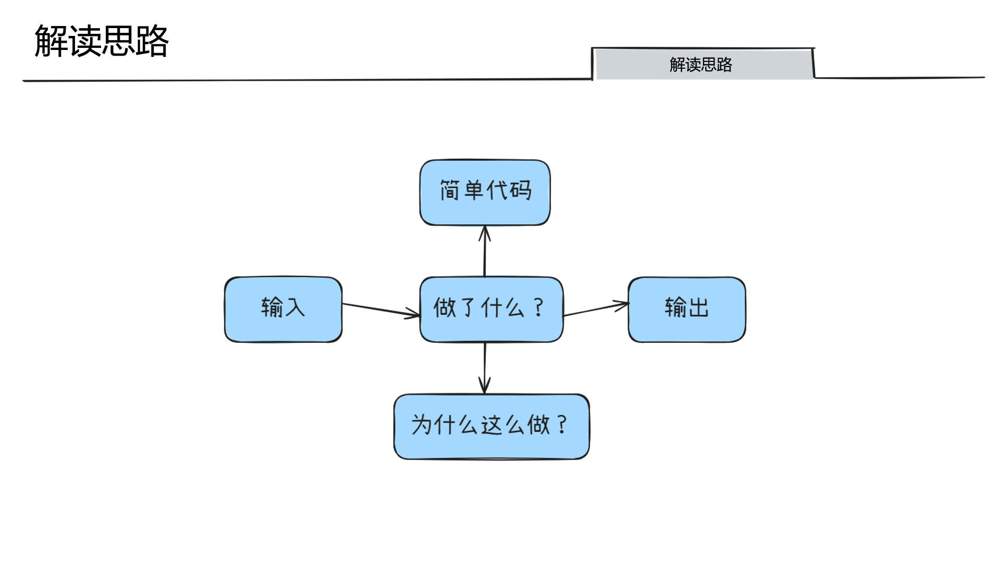

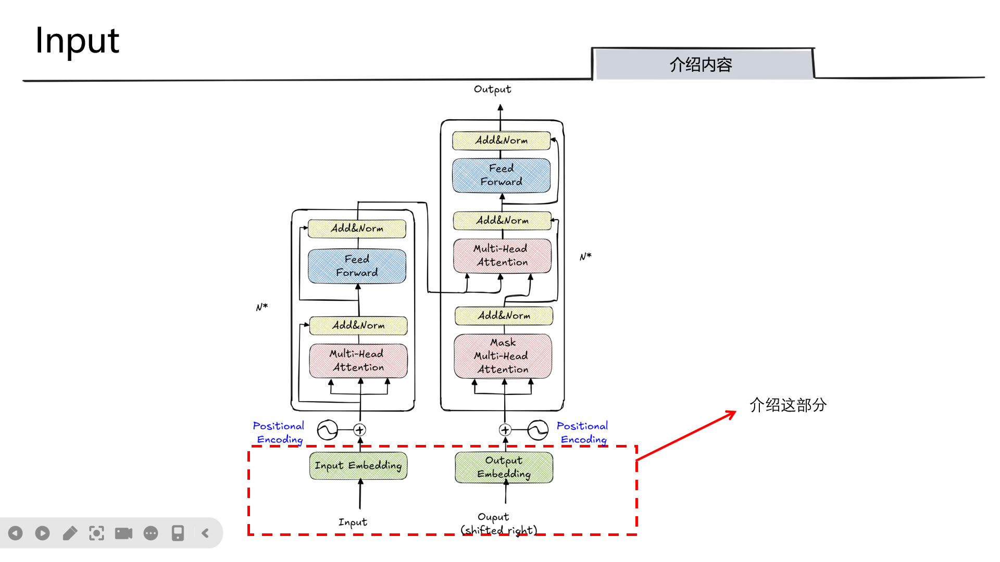

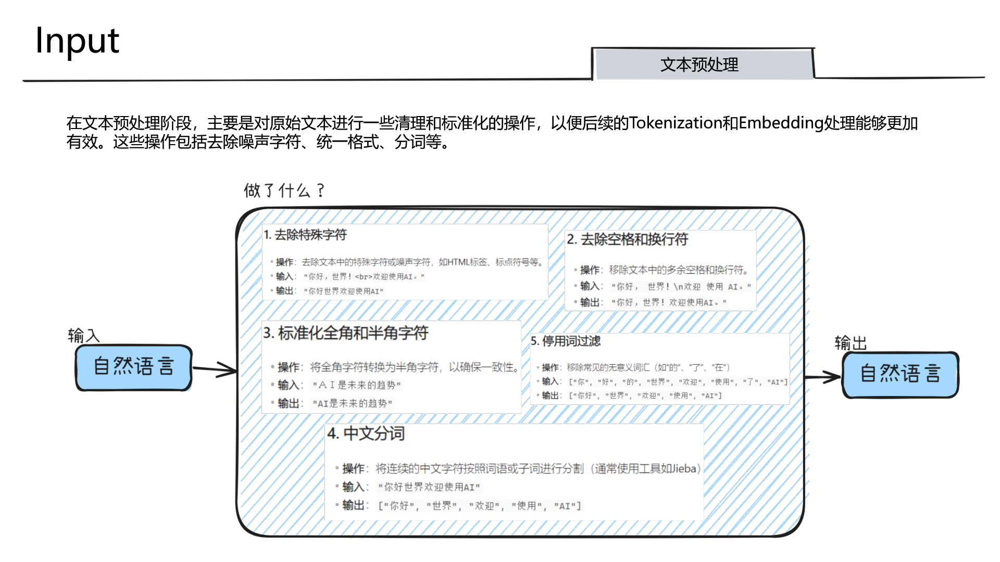

In [1]:
import re
import jieba

def preprocess_text(text):
    # 1. 去除HTML标签或特殊字符
    text = re.sub(r'<[^>]+>', '', text)  # 移除HTML标签
    text = re.sub(r'[^\w\s]', '', text)  # 移除标点符号

    # 2. 去除多余空格和换行符
    text = re.sub(r'\s+', '', text)  # 移除空格和换行符

    # 3. 全角转半角
    def fullwidth_to_halfwidth(ustring):
        return ''.join([chr(ord(char) - 65248) if 65281 <= ord(char) <= 65374 else char for char in ustring])

    text = fullwidth_to_halfwidth(text)

    # 4. 中文分词
    words = jieba.lcut(text)

    # 5. 停用词过滤（假设有停用词列表）
    stopwords = set(['的', '了', '在'])  # 示例停用词
    words = [word for word in words if word not in stopwords]

    return words

# 示例输入文本
text = "你好，世界！<br>欢迎使用AI。"

# 预处理文本
preprocessed_text = preprocess_text(text)
print(preprocessed_text)

/usr/local/lib/python3.12/dist-packages/jieba/__init__.py:44: SyntaxWarning: invalid escape sequence '\.'
  re_han_default = re.compile("([\u4E00-\u9FD5a-zA-Z0-9+#&\._%\-]+)", re.U)
/usr/local/lib/python3.12/dist-packages/jieba/__init__.py:46: SyntaxWarning: invalid escape sequence '\s'
  re_skip_default = re.compile("(\r\n|\s)", re.U)
/usr/local/lib/python3.12/dist-packages/jieba/finalseg/__init__.py:78: SyntaxWarning: invalid escape sequence '\.'
  re_skip = re.compile("([a-zA-Z0-9]+(?:\.\d+)?%?)")
Building prefix dict from the default dictionary ...
DEBUG:jieba:Building prefix dict from the default dictionary ...
Dumping model to file cache /tmp/jieba.cache
DEBUG:jieba:Dumping model to file cache /tmp/jieba.cache
Loading model cost 1.324 seconds.
DEBUG:jieba:Loading model cost 1.324 seconds.
Prefix dict has been built successfully.
DEBUG:jieba:Prefix dict has been built successfully.


['你好', '世界', '欢迎', '使用', 'AI']


为什么？为什么需要对文本进行预处理

简单来说，**数据预处理是决定大模型“智商”和“三观”的关键。**

就像做一道高级料理，如果食材里混有泥沙、烂叶或塑料，无论厨师（算法）多牛，火候（算力）多足，最后做出来的菜（模型）也会难以下咽甚至有毒。

### 为什么大模型训练需要预处理？

大模型通常从互联网抓取海量数据（如 Common Crawl），这些原始数据质量极差，直接训练会导致以下问题：

1. **垃圾进，垃圾出 (Garbage In, Garbage Out)**：
    
    - **低质量文本**：包含大量广告、乱码、HTML标签（如你图中的 `<br>`）或重复的废话。这会降低模型的语言逻辑和表达能力。
        
    - **错误知识**：包含谣言、逻辑不通的内容。
        
2. **安全性与偏见**：
    
    - **有害内容**：原始数据中混杂着暴力、歧视、仇恨言论。如果不清洗，模型会学坏，输出危险言论。
        
    - **隐私信息**：可能包含他人的电话、身份证号、私人地址（PII 数据）。
        
3. **计算效率（省钱省时）**：
    
    - **去重**：互联网数据有大量重复。通过去重（Deduplication），可以减少 30%-50% 的训练量，大大缩短训练时间，且研究证明去重能显著提升模型泛化能力。
        
4. **格式统一**：
    
    - 将不同来源的 PDF、Word、HTML 统一转为纯文本，并进行分词（Tokenization），让模型能读懂。

现在业界公认的**标准工具栈**是：

|**阶段**|**推荐工具 (大家都在用)**|
|---|---|
|**整体管线**|**[Data-Juicer](https://github.com/modelscope/data-juicer)** (阿里开源，目前最全的 LLM 算子库)|
|**大规模去重**|**[datatrove](https://github.com/huggingface/datatrove)** (HuggingFace 出品，支持海量数据去重)|
|**基础清洗**|**[resiliparse](https://www.google.com/search?q=https://github.com/chatnoir-resiliparse/resiliparse)** (极速处理 Common Crawl 数据)|
|**文本提取**|**[Trafilatura](https://github.com/adbar/trafilatura)** (目前公认网页转文本效果最好的库)|

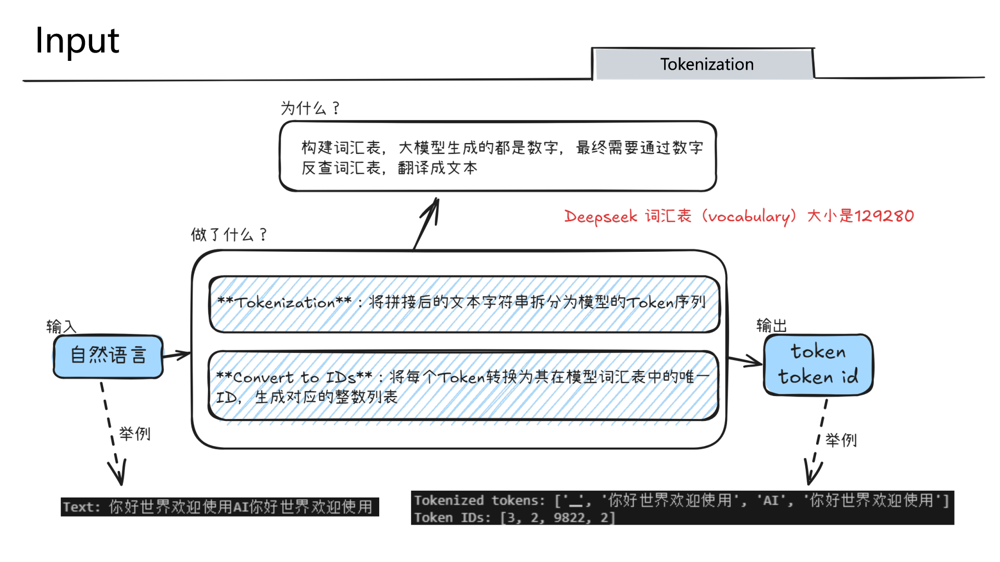

In [2]:
from transformers import T5Tokenizer
tokenizer = T5Tokenizer.from_pretrained('t5-small')
preprocessed_text = ['你好', '世界', '欢迎', '使用', 'AI', '你好', '世界欢迎使用']

# 将预处理后的文本拼接成字符串，供Tokenizer使用
text = ''.join(preprocessed_text)
print("Text:", text)

# 执行Tokenization
tokens = tokenizer.tokenize(text)
token_ids = tokenizer.convert_tokens_to_ids(tokens)

print("Tokenized tokens:", tokens)
print("Token IDs:", token_ids)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/2.32k [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.39M [00:00<?, ?B/s]

You are using the default legacy behaviour of the <class 'transformers.models.t5.tokenization_t5.T5Tokenizer'>. This is expected, and simply means that the `legacy` (previous) behavior will be used so nothing changes for you. If you want to use the new behaviour, set `legacy=False`. This should only be set if you understand what it means, and thoroughly read the reason why this was added as explained in https://github.com/huggingface/transformers/pull/24565


Text: 你好世界欢迎使用AI你好世界欢迎使用
Tokenized tokens: ['▁', '你好世界欢迎使用', 'AI', '你好世界欢迎使用']
Token IDs: [3, 2, 9822, 2]


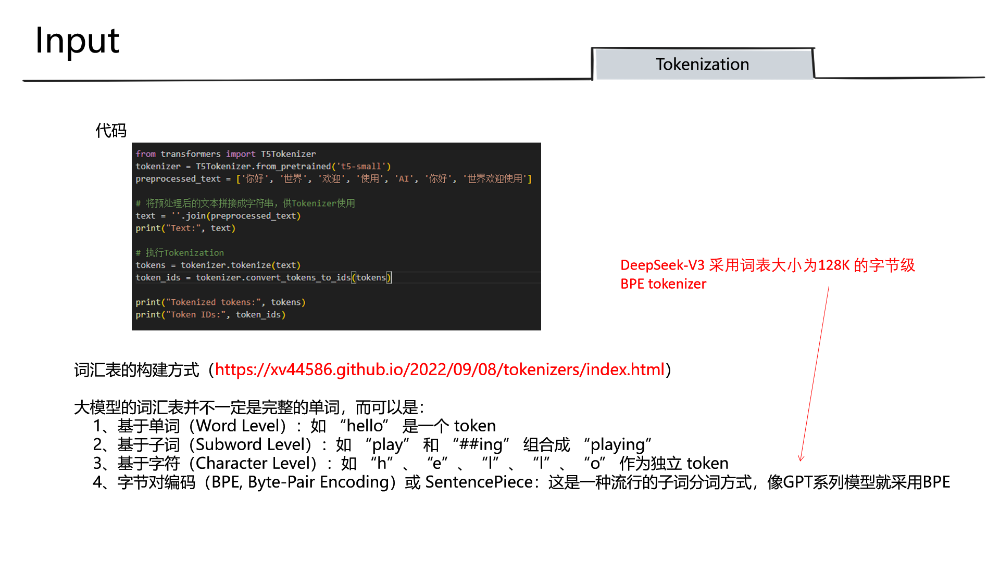

In [3]:
from transformers import AutoTokenizer
# 基础子词分词 (Subword Tokenization)
# 1. 加载一个预训练的词表模型 (以经典的 BERT 为例)
tokenizer = AutoTokenizer.from_pretrained("bert-base-chinese")

text = "DeepSeek不仅好用，而且是开源的。"

# 2. 执行分词
tokens = tokenizer.tokenize(text)
token_ids = tokenizer.convert_tokens_to_ids(tokens)

print(f"原始文本: {text}")
print(f"分词结果: {tokens}")
print(f"对应的ID: {token_ids}")

tokenizer_config.json:   0%|          | 0.00/49.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/624 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/110k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/269k [00:00<?, ?B/s]

原始文本: DeepSeek不仅好用，而且是开源的。
分词结果: ['[UNK]', '不', '仅', '好', '用', '，', '而', '且', '是', '开', '源', '的', '。']
对应的ID: [100, 679, 788, 1962, 4500, 8024, 5445, 684, 3221, 2458, 3975, 4638, 511]


In [4]:
import tiktoken

# 1. 加载 GPT-4 使用的 BPE 编码器 (o200k_base 或 cl100k_base)
# 这类编码器词表很大（通常约 100k-128k），与 DeepSeek-V3 的词表大小接近
# BPE
enc = tiktoken.get_encoding("cl100k_base")

text = "DeepSeek不仅好用，而且是开源的。"

# 2. 编码：将文本转为 ID
token_ids = enc.encode(text)

# 3. 解码：查看每个 ID 对应的内容
tokens = [enc.decode([id]) for id in token_ids]

print(f"分词详情: {tokens}")
print(f"Token IDs: {token_ids}")

分词详情: ['Deep', 'Seek', '不', '�', '�', '好', '用', '，', '而', '�', '�', '是', '开', '源', '的', '。']
Token IDs: [34564, 40450, 16937, 6271, 227, 53901, 11883, 3922, 69636, 3574, 242, 21043, 30867, 39084, 9554, 1811]


目前业界主流的生成式大模型（如 GPT-4, Llama 3, DeepSeek, 通义千问 Qwen）几乎统一采用了 **字节级字节对编码（Byte-level BPE）**。

虽然算法原理相似，但各家在**词表大小（Vocab Size）和针对语言的优化**上有明显差异。

### 1. 主流模型分词器对比

|**模型家族**|**分词器实现 / 工具**|**词表大小**|**特点**|
|---|---|---|---|
|**GPT-4o**|`o200k_base` (tiktoken)|**~200,000**|目前最大的词表之一，极大提升了中韩日文的压缩率，非常节省 Token。|
|**DeepSeek-V3**|自研 BPE (HuggingFace)|**129,280**|针对中文和代码深度优化，中文压缩比极高，且包含大量代码常用缩进/空格 Token。|
|**Llama 3 / 3.1**|`tiktoken` 格式|**128,256**|相比 Llama 2 (32k) 词表大幅增加，从 SentencePiece 切换到了 tiktoken 实现。|
|**Qwen 2.5**|`qwen.ticktoken`|**151,643**|阿里自研，对亚洲语言极度友好，单个 Token 涵盖的信息量很大。|

---

### 2. 举个例子：不同分词器的“中文效率”

我们以 **“人工智能”** 这四个字为例，看看不同时代的词表是如何切分的：

- **旧时代 (Llama 2 - 32K 词表):** 可能被切成 8-12 个 Token（每个字被拆成 3 个字节零件）。
    
- **新时代 (DeepSeek-V3 - 128K 词表):** 可能只有 **1 个 Token**。因为“人工智能”作为一个高频词，直接被收录进了 12.8 万个坑位中。
    

**这意味着：** 处理同样的文本，DeepSeek 比老模型更快、更省钱（因为 Token 数少了）。

In [5]:
import tiktoken
from transformers import AutoTokenizer

text = "DeepSeek不仅好用，而且是开源的。"

# 1. GPT-4o 的分词器 (o200k)
enc_gpt4o = tiktoken.get_encoding("o200k_base")
tokens_gpt4o = enc_gpt4o.encode(text)

# 2. Llama 3 的分词器
# 注意：这需要联网下载，或者你本地有模型文件
# tokenizer_llama3 = AutoTokenizer.from_pretrained("meta-llama/Meta-Llama-3-8B")
# tokens_llama3 = tokenizer_llama3.encode(text)

print(f"待处理文本: {text}")
print(f"GPT-4o Token 数量: {len(tokens_gpt4o)}")
print(f"GPT-4o Token 内容: {[enc_gpt4o.decode([t]) for t in tokens_gpt4o]}")

# 解释现象
# 你会发现，词表越大的模型，切分出的中文越“完整”，乱码碎片越少。

待处理文本: DeepSeek不仅好用，而且是开源的。
GPT-4o Token 数量: 11
GPT-4o Token 内容: ['Deep', 'Seek', '不仅', '好', '用', '，而且', '是', '开', '源', '的', '。']


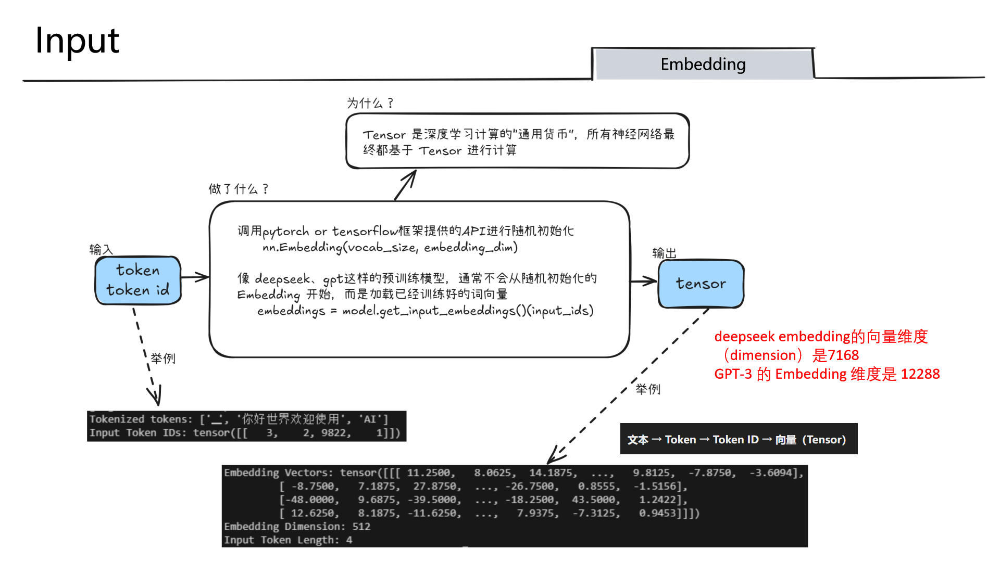

In [6]:
import torch
from transformers import T5Tokenizer, T5Model

# 初始化T5的Tokenizer和模型
tokenizer = T5Tokenizer.from_pretrained('t5-small')
model = T5Model.from_pretrained('t5-small')
# 预处理后的文本示例
preprocessed_text = ['你好', '世界', '欢迎', '使用', 'AI']
# 将预处理后的文本拼接成字符串
text = ''.join(preprocessed_text)
# 执行Tokenization
tokens = tokenizer.tokenize(text)
input_ids = tokenizer(text, return_tensors='pt').input_ids

# 获取Embedding向量
with torch.no_grad():
    embeddings = model.get_input_embeddings()(input_ids)
print("Tokenized tokens:", tokens)
print("Input Token IDs:", input_ids)
print("Embedding Vectors:", embeddings)

# 获取Token Embedding的维度
embedding_layer = model.get_input_embeddings()
embedding_dim = embedding_layer.embedding_dim
# 获取输入Token的长度
input_length = input_ids.size(1)
print("Embedding Dimension:", embedding_dim)
print("Input Token Length:", input_length)


config.json:   0%|          | 0.00/1.21k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/242M [00:00<?, ?B/s]

Tokenized tokens: ['▁', '你好世界欢迎使用', 'AI']
Input Token IDs: tensor([[   3,    2, 9822,    1]])
Embedding Vectors: tensor([[[ 11.2500,   8.0625,  14.1875,  ...,   9.8125,  -7.8750,  -3.6094],
         [ -8.7500,   7.1875,  27.8750,  ..., -26.7500,   0.8555,  -1.5156],
         [-48.0000,   9.6875, -39.5000,  ..., -18.2500,  43.5000,   1.2422],
         [ 12.6250,   8.1875, -11.6250,  ...,   7.9375,  -7.3125,   0.9453]]])
Embedding Dimension: 512
Input Token Length: 4


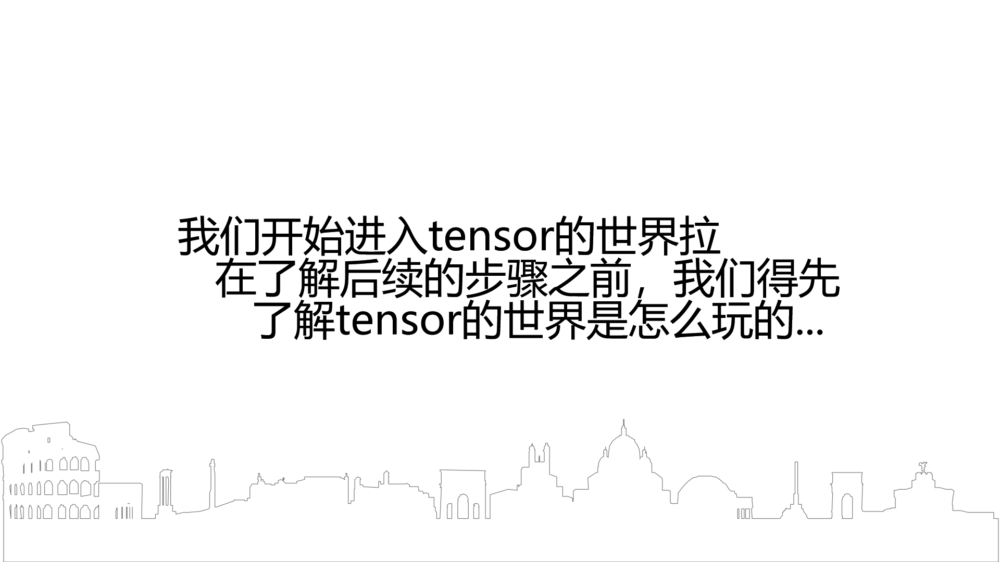

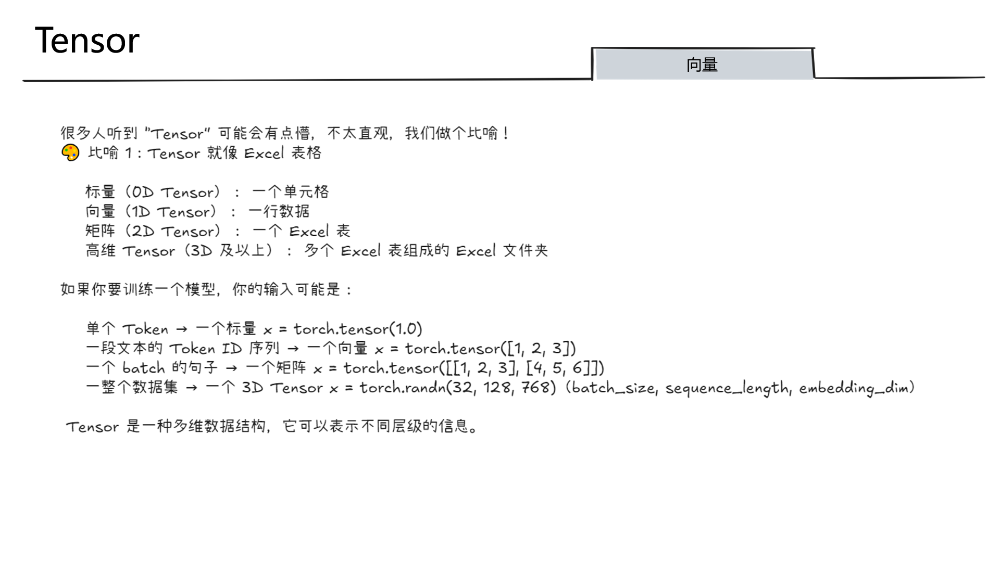

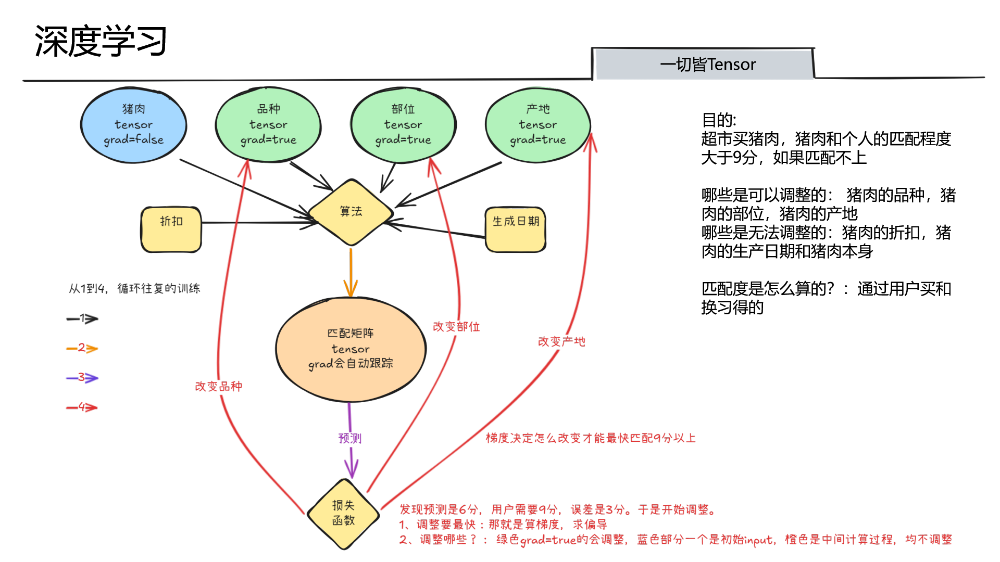

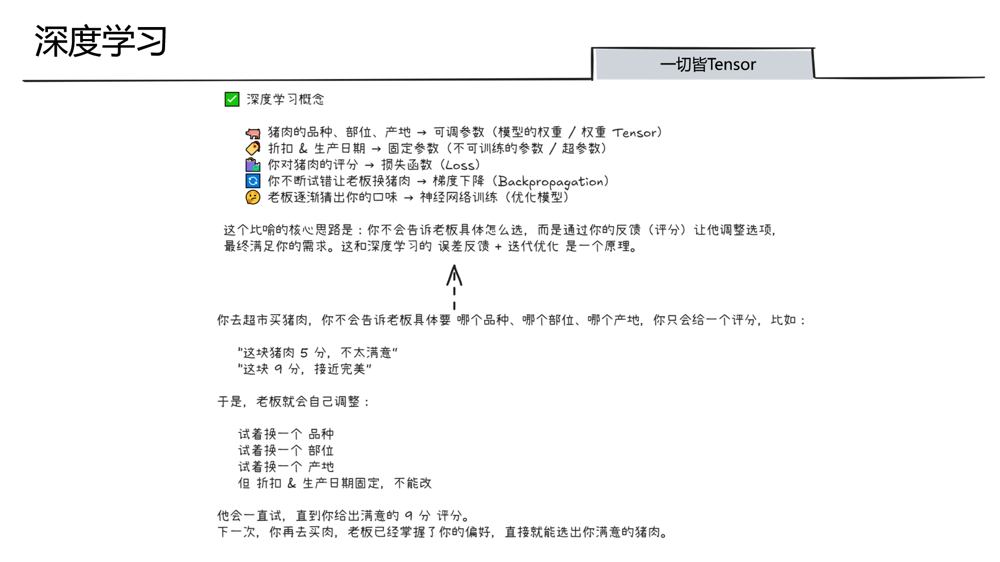

In [7]:
# 大模型是怎么定义哪些参数调整，哪些参数不调整的
import torch
# 创建一个需要梯度的张量
a = torch.tensor([2.0, 3.0], requires_grad=True)
b = torch.tensor([4.0, 5.0], requires_grad=False)

c = torch.matmul(a, b)

# 定义一个简单的损失函数
loss = c.sum()

# 进行反向传播，计算梯度
loss.backward()

# 查看梯度
print(f"Gradient of a: {a.grad}")  # 输出 a 的梯度
print(f"Gradient of b: {b.grad}")  # 输出 b 的梯度

# 查看反向传播后的张量值
print(f"Value of a before optimizer step: {a}")  # a 的值没有改变
print(f"Value of b before optimizer step: {b}")  # b 的值没有改变

# 使用优化器更新 a 的值
optimizer = torch.optim.SGD([a, b], lr=0.1)
optimizer.step()

# 查看更新后的张量值
print(f"Value of a after optimizer step: {a}")
print(f"Value of b after optimizer step: {b}")


Gradient of a: tensor([4., 5.])
Gradient of b: None
Value of a before optimizer step: tensor([2., 3.], requires_grad=True)
Value of b before optimizer step: tensor([4., 5.])
Value of a after optimizer step: tensor([1.6000, 2.5000], requires_grad=True)
Value of b after optimizer step: tensor([4., 5.])


1. 准备 100 条猪肉数据 (Tensor)
我们随机生成 100 块肉的初始属性，并设定这些属性是可调节的 (grad=True)。

In [8]:
import torch

# 1. 模拟 100 条猪肉数据
torch.manual_seed(42)
# 1. 模拟 100 条猪肉的特征 (品种, 部位, 产地)
X_train = torch.randn(100, 3)

y_target = torch.full((100, 1), 9.0)


weights = torch.randn((3, 1), requires_grad=True)

# 3. 【黄色部分】：冻结参数
discount = torch.tensor([0.9], requires_grad=False)
freshness_effect = torch.tensor([0.5], requires_grad=False)

learning_rate = 0.001

print("开始训练： Loss 会稳步下降")
print("-" * 45)



开始训练： Loss 会稳步下降
---------------------------------------------


2. 训练过程：老板根据反馈“整容”猪肉
老板会循环 100 次，根据你的评分反馈，直接修改这 100 块猪肉的品种、部位和产地。

In [9]:
# 4. 训练循环
for epoch in range(100):
    # 前向传播
    # 这里我们手动把 X_train 缩小一点，效果和缩小 weights 一样，且不破坏 weights 的叶子属性
    predictions = (X_train @ weights + freshness_effect) * discount

    # 损失计算
    loss = torch.mean((predictions - y_target)**2)

    # 反向传播
    loss.backward()

    # 5. 更新参数
    with torch.no_grad():
        # 现在 weights.grad 保证不是 None
        weights -= learning_rate * weights.grad

        # 归零梯度
        weights.grad.zero_()

    if epoch % 20 == 0 or epoch == 1:
        print(f"轮次: {epoch:3d} | Loss: {loss.item():.4f} | 平均预测分: {predictions.mean().item():.2f}")

print("-" * 45)



轮次:   0 | Loss: 74.3524 | 平均预测分: 0.43
轮次:   1 | Loss: 74.3466 | 平均预测分: 0.43
轮次:  20 | Loss: 74.2414 | 平均预测分: 0.43
轮次:  40 | Loss: 74.1375 | 平均预测分: 0.43
轮次:  60 | Loss: 74.0402 | 平均预测分: 0.43
轮次:  80 | Loss: 73.9491 | 平均预测分: 0.44
---------------------------------------------


3. 模拟新输入：查看训练后的结果
现在我们来看看，经过训练后，这 100 块肉变成了什么样？

In [10]:
# 6. 预测新输入
new_pork = torch.tensor([[1.0, 1.0, 1.0]])
with torch.no_grad():
    res = (new_pork @ weights + freshness_effect) * discount
    print(f"输入新猪肉 [1.0, 1.0, 1.0]，老板预测分: {res.item():.2f}")

输入新猪肉 [1.0, 1.0, 1.0]，老板预测分: -0.04


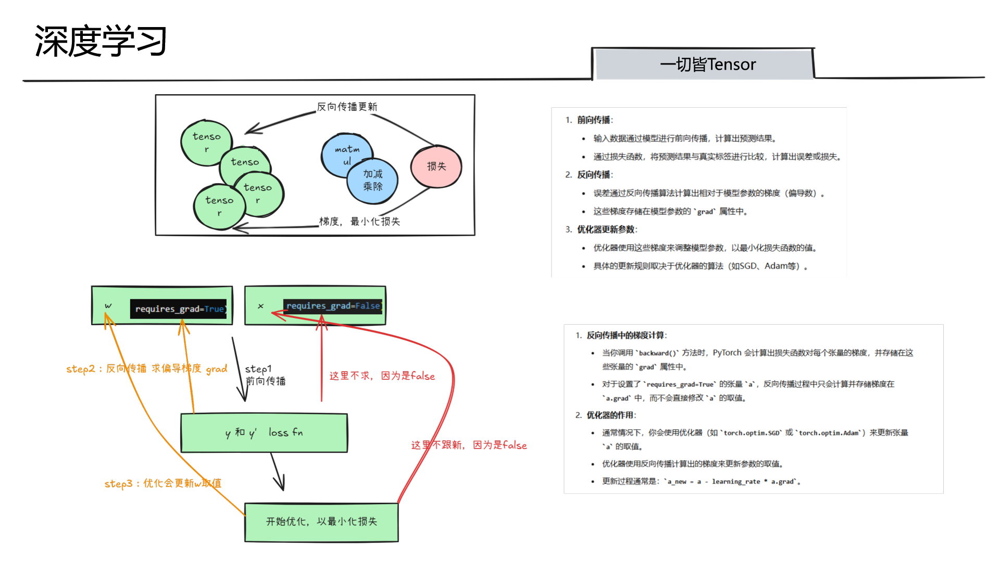

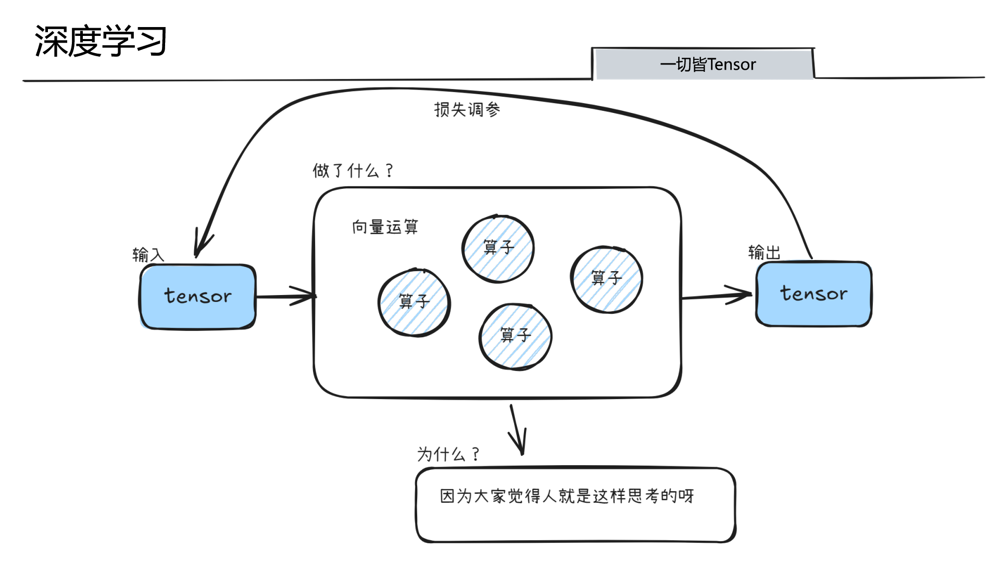

In [11]:
# 改个玩法，用神经网络来卖猪肉
import torch
import torch.nn as nn
import torch.optim as optim

# 1. 模拟 100 条训练数据
torch.manual_seed(42) # 保证你运行的结果和我一样

# 假设老板观察到 3 个特征：[品种评分, 部位评分, 产地评分] (范围 0-10)
X_train = torch.rand(100, 3) * 10

# 假设你内心有一个隐藏的评分准则（老板不知道）：
# 最终评分 = 品种*0.5 + 部位*0.3 + 产地*0.2 (再加一点点折扣影响)
true_weights = torch.tensor([0.5, 0.3, 0.2])
y_train = X_train @ true_weights + torch.randn(100) * 0.1 # 加点随机噪声模拟人的心情波动
y_train = y_train.unsqueeze(1) # 变成 (100, 1) 的形状

print(f"数据准备完毕，前 3 条猪肉特征:\n{X_train[:3]}")
print(f"对应的用户评分:\n{y_train[:3]}")

# 2. 定义模型 (老板的学习过程)
model = nn.Linear(3, 1) # 输入 3 个特征，输出 1 个评分
optimizer = optim.SGD(model.parameters(), lr=0.01) # 优化器
criterion = nn.MSELoss() # 损失函数

# 3. 开始训练 (老板在 100 块肉中学习你的偏好)
for epoch in range(500):
    # 前向传播
    predictions = model(X_train)
    loss = criterion(predictions, y_train)

    # 反向传播与优化
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    if (epoch + 1) % 100 == 0:
        print(f"训练第 {epoch+1} 轮, 误差(Loss): {loss.item():.4f}")

print("\n训练完成！老板已经摸透了你的口味。")


# 4. 模拟新的输入
# 比如今天超市新进了一块肉：品种 8 分，部位 9 分，产地 2 分
new_pork = torch.tensor([[8.0, 9.0, 2.0]])

model.eval() # 切换到预测模式
with torch.no_grad():
    predicted_score = model(new_pork)

# 计算我们隐藏逻辑的真实得分作为对比：8*0.5 + 9*0.3 + 2*0.2 = 4 + 2.7 + 0.4 = 7.1
print("-" * 30)
print(f"【新猪肉属性】: 品种 8, 部位 9, 产地 2")
print(f"【老板预测你会打】: {predicted_score.item():.2f} 分")
print(f"【你的心理真实分】: 约 7.10 分")
print("-" * 30)

# 查看老板学到的“权重”
weights = model.weight.data
print(f"老板学到的偏好权重: {weights[0][0]:.2f} (品种), {weights[0][1]:.2f} (部位), {weights[0][2]:.2f} (产地)")

数据准备完毕，前 3 条猪肉特征:
tensor([[8.8227, 9.1500, 3.8286],
        [9.5931, 3.9045, 6.0090],
        [2.5657, 7.9364, 9.4077]])
对应的用户评分:
tensor([[7.8664],
        [7.0728],
        [5.6325]])
训练第 100 轮, 误差(Loss): 0.0170
训练第 200 轮, 误差(Loss): 0.0139
训练第 300 轮, 误差(Loss): 0.0119
训练第 400 轮, 误差(Loss): 0.0106
训练第 500 轮, 误差(Loss): 0.0098

训练完成！老板已经摸透了你的口味。
------------------------------
【新猪肉属性】: 品种 8, 部位 9, 产地 2
【老板预测你会打】: 7.11 分
【你的心理真实分】: 约 7.10 分
------------------------------
老板学到的偏好权重: 0.50 (品种), 0.30 (部位), 0.21 (产地)


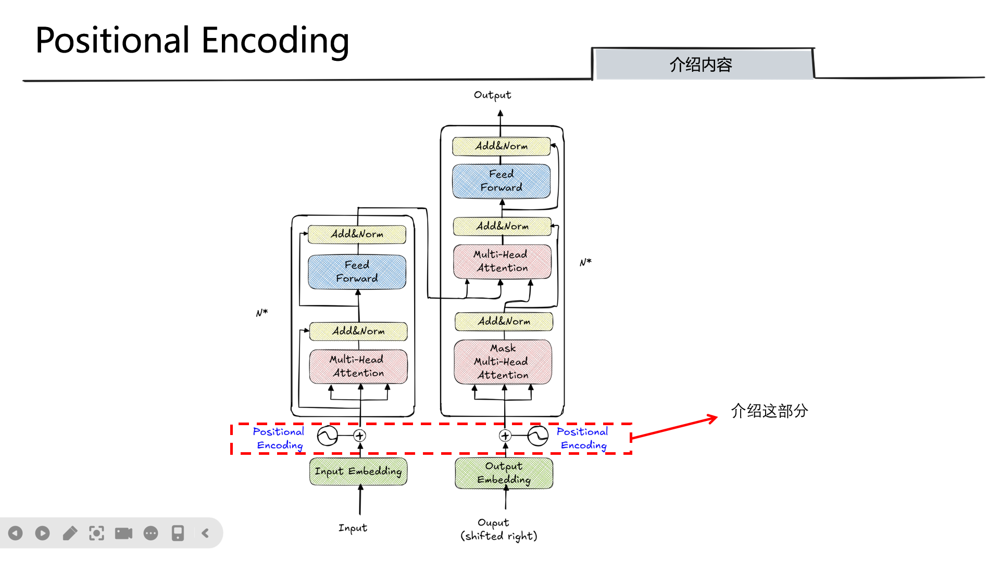

requires_grad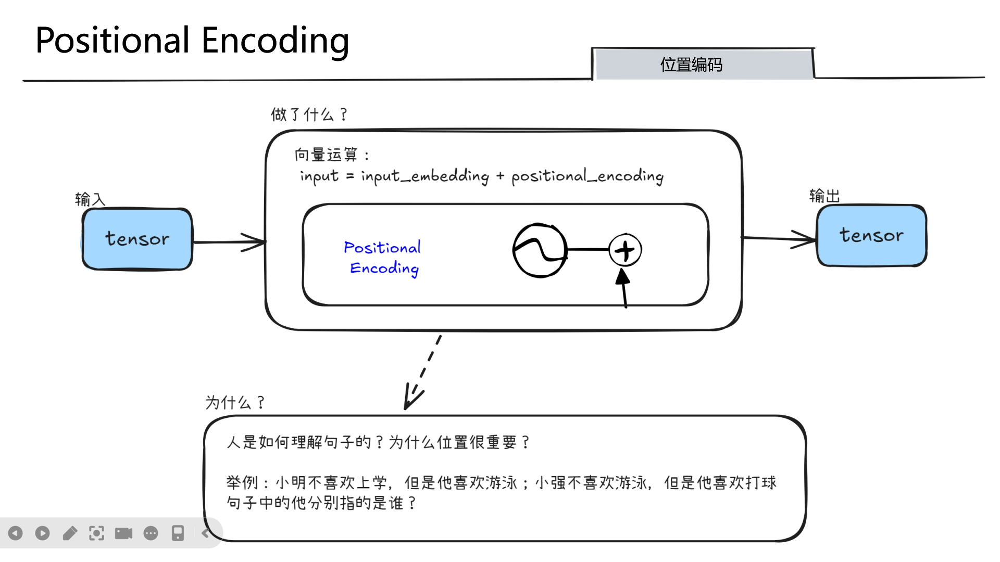

位置编码核心要解决的问题：
（1）它能用来表示一个token在序列中的绝对位置
（2）在序列长度不同的情况下，不同序列中token的相对位置/距离也要保持一致
（3）可以用来表示模型在训练过程中从来没有看到过的句子长度。
     （https://juejin.cn/post/7241859817563258917）

In [12]:
import torch
import numpy as np

def positional_encoding(seq_len, d_model):
    pos = np.arange(seq_len)[:, np.newaxis]
    i = np.arange(d_model)[np.newaxis, :]

    angle_rates = 1 / np.power(10000, (2 * (i // 2)) / np.float32(d_model))
    angle_rads = pos * angle_rates

    # 应用sin到偶数索引 (2i) 和 cos到奇数索引 (2i+1)
    pos_encoding = np.zeros((seq_len, d_model))
    pos_encoding[:, 0::2] = np.sin(angle_rads[:, 0::2])
    pos_encoding[:, 1::2] = np.cos(angle_rads[:, 1::2])

    return torch.tensor(pos_encoding, dtype=torch.float32)

# 示例参数
seq_len = 4   # 序列长度
d_model = 48  # 模型的维度

# 生成 Positional Encoding
pos_encoding = positional_encoding(seq_len, d_model)

# 设置NumPy打印选项，以显示完整内容
np.set_printoptions(threshold=np.inf, suppress=True, precision=4)

# 打印 Positional Encoding
print("Positional Encoding:\n", pos_encoding.numpy())

Positional Encoding:
 [[ 0.      1.      0.      1.      0.      1.      0.      1.      0.
   1.      0.      1.      0.      1.      0.      1.      0.      1.
   0.      1.      0.      1.      0.      1.      0.      1.      0.
   1.      0.      1.      0.      1.      0.      1.      0.      1.
   0.      1.      0.      1.      0.      1.      0.      1.      0.
   1.      0.      1.    ]
 [ 0.8415  0.5403  0.6298  0.7768  0.4477  0.8942  0.311   0.9504  0.2138
   0.9769  0.1463  0.9892  0.0998  0.995   0.0681  0.9977  0.0464  0.9989
   0.0316  0.9995  0.0215  0.9998  0.0147  0.9999  0.01    0.9999  0.0068
   1.      0.0046  1.      0.0032  1.      0.0022  1.      0.0015  1.
   0.001   1.      0.0007  1.      0.0005  1.      0.0003  1.      0.0002
   1.      0.0001  1.    ]
 [ 0.9093 -0.4161  0.9784  0.2067  0.8006  0.5992  0.5911  0.8066  0.4177
   0.9086  0.2894  0.9572  0.1987  0.9801  0.1358  0.9907  0.0927  0.9957
   0.0632  0.998   0.0431  0.9991  0.0294  0.9996  0.02    0

输出矩阵中：

- **第 0 行**：代表序列中第 1 个词（Token 0）的地理位置信息。
    
- **第 1 行**：代表序列中第 2 个词（Token 1）的地理位置信息。
    
- **第 $n$ 行**：代表序列中第 $n+1$ 个词的位置。

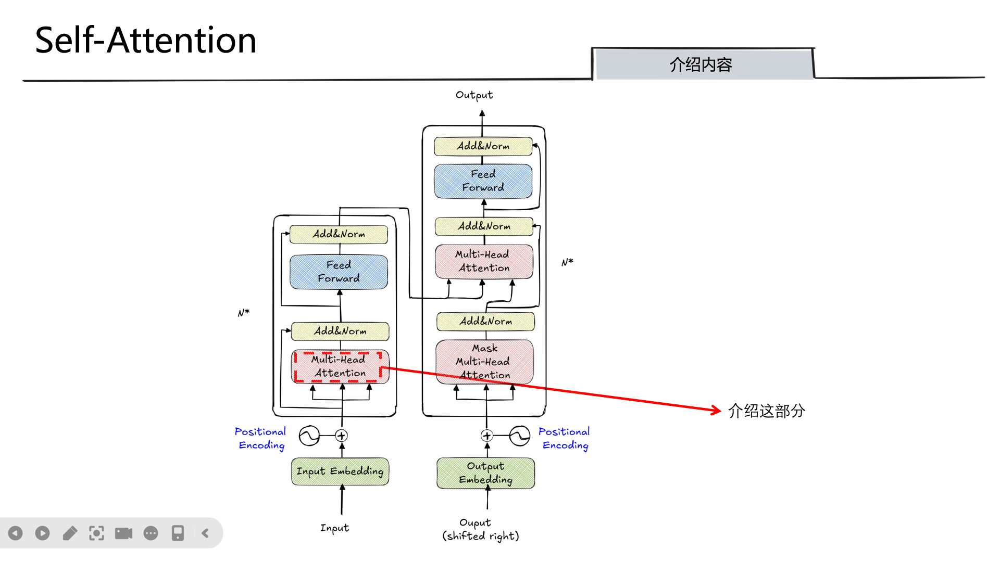

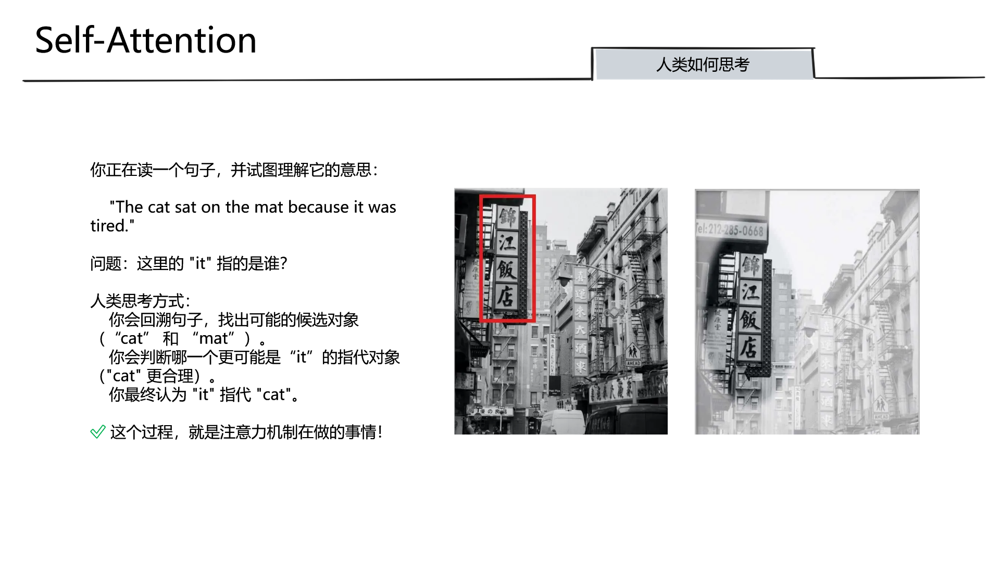

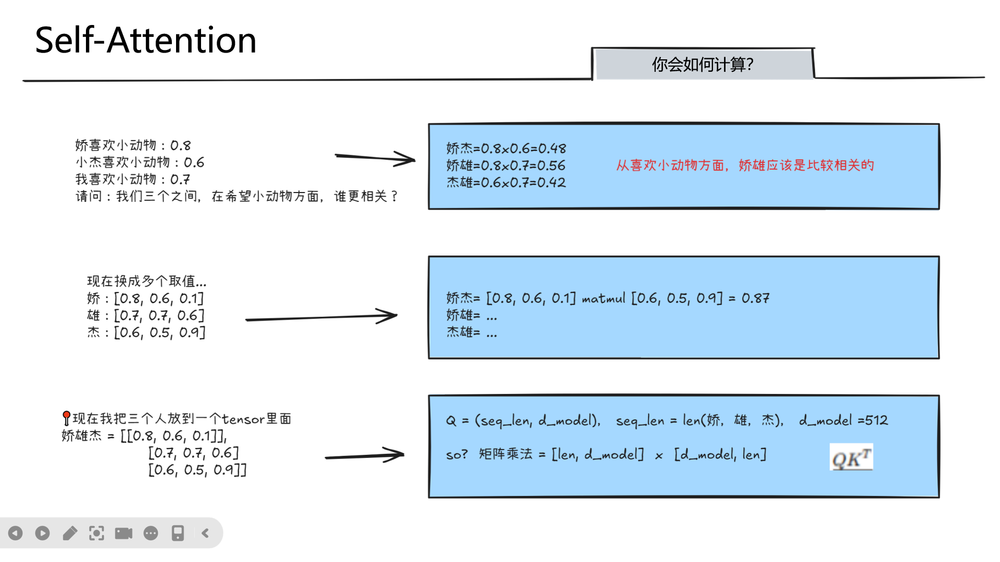

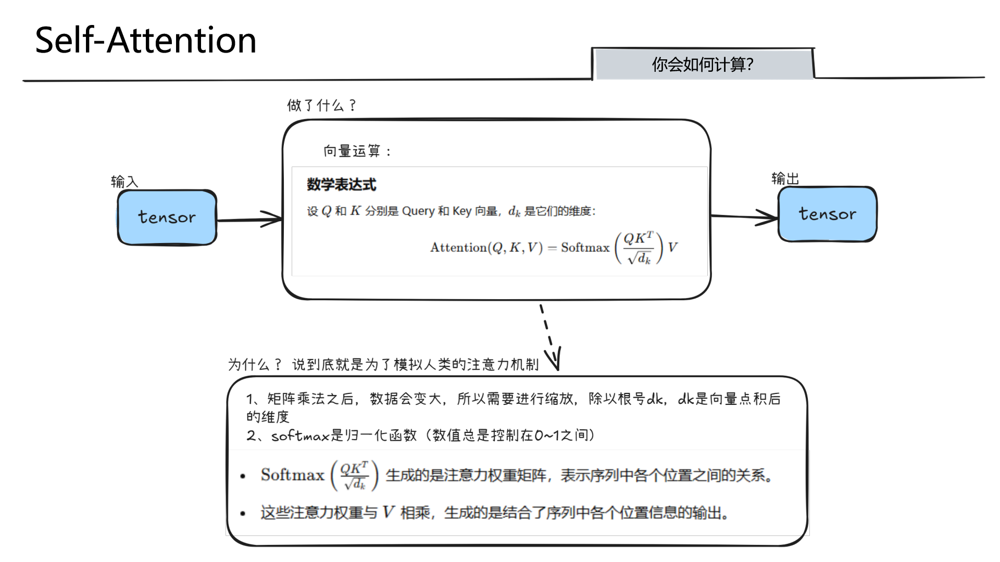

In [13]:
import torch
import torch.nn.functional as F

# 示例输入：批大小为1，序列长度为3，嵌入维度为4
input_tensor = torch.tensor([[[1.0, 0.0, 1.0, 0.0],
                              [0.0, 2.0, 0.0, 2.0],
                              [1.0, 1.0, 1.0, 1.0]]])  # (1, 3, 4)

# 随机初始化Query, Key, Value的权重矩阵
W_q = torch.rand(4, 4)
W_k = torch.rand(4, 4)
W_v = torch.rand(4, 4)

print("Weight Matrix W_q:\n", W_q)
print("Weight Matrix W_k:\n", W_k)
print("Weight Matrix W_v:\n", W_v)

# 计算Query, Key, Value向量
Q = torch.matmul(input_tensor, W_q)  # (1, 3, 4)
K = torch.matmul(input_tensor, W_k)  # (1, 3, 4)
V = torch.matmul(input_tensor, W_v)  # (1, 3, 4)

print("\nQuery (Q) Matrix:\n", Q)
print("Key (K) Matrix:\n", K)
print("Value (V) Matrix:\n", V)



# 计算注意力分数
attention_scores = torch.matmul(Q, K.transpose(-2, -1)) / torch.sqrt(torch.tensor(4.0))
attention_weights = F.softmax(attention_scores, dim=-1)

print("\nAttention Scores (before softmax):\n", attention_scores)
print("Attention Weights (after softmax):\n", attention_weights)

# 计算Self-Attention的输出
output_tensor = torch.matmul(attention_weights, V)

print("\nSelf-Attention Output:\n", output_tensor)

Weight Matrix W_q:
 tensor([[0.4759, 0.3171, 0.1252, 0.7966],
        [0.9021, 0.5811, 0.4129, 0.0369],
        [0.3179, 0.6273, 0.7358, 0.4368],
        [0.3023, 0.7786, 0.1018, 0.8160]])
Weight Matrix W_k:
 tensor([[0.3060, 0.5077, 0.4012, 0.5606],
        [0.3489, 0.8636, 0.4870, 0.8903],
        [0.9807, 0.2564, 0.1352, 0.9012],
        [0.8918, 0.1182, 0.4613, 0.0069]])
Weight Matrix W_v:
 tensor([[0.0907, 0.5966, 0.6330, 0.6060],
        [0.3639, 0.9613, 0.5715, 0.2050],
        [0.4717, 0.6201, 0.6751, 0.1465],
        [0.6874, 0.2446, 0.0845, 0.2269]])

Query (Q) Matrix:
 tensor([[[0.7937, 0.9444, 0.8609, 1.2334],
         [2.4088, 2.7194, 1.0295, 1.7057],
         [1.9981, 2.3041, 1.3757, 2.0862]]])
Key (K) Matrix:
 tensor([[[1.2868, 0.7641, 0.5364, 1.4618],
         [2.4814, 1.9636, 1.8967, 1.7945],
         [2.5275, 1.7458, 1.4848, 2.3590]]])
Value (V) Matrix:
 tensor([[[0.5624, 1.2166, 1.3081, 0.7525],
         [2.1026, 2.4117, 1.3120, 0.8637],
         [1.6137, 2.4225, 1.9

不知道大家有没有发现，在计算QKV算法的时候，会乘以一个权重矩阵，这是为什么呢？为什么不是直接用input tensor直接计算呢？

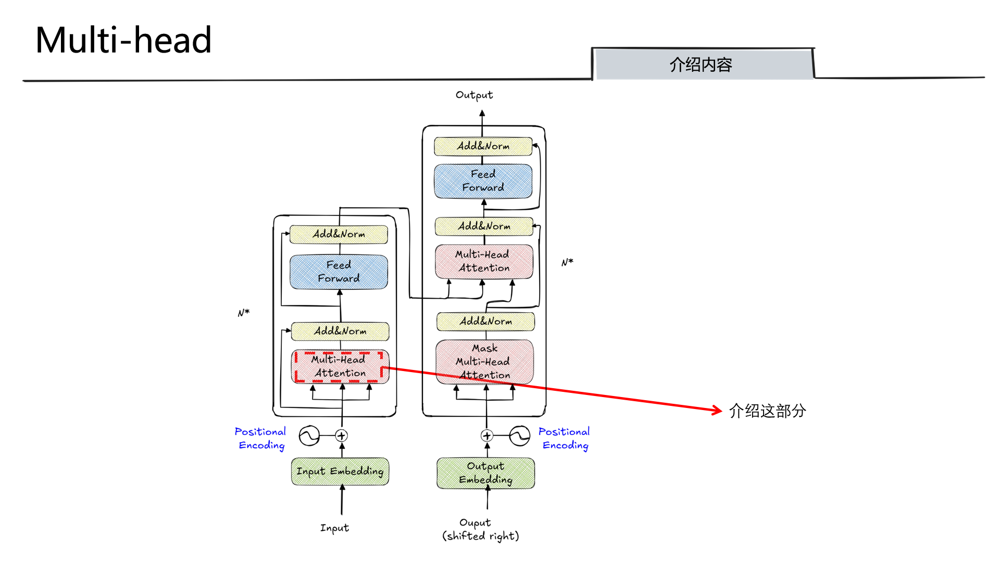

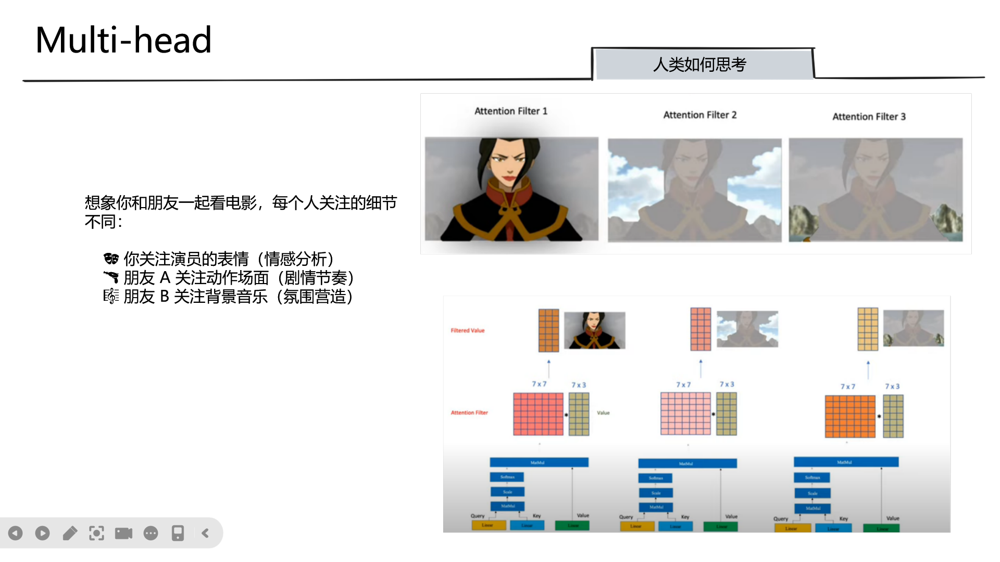

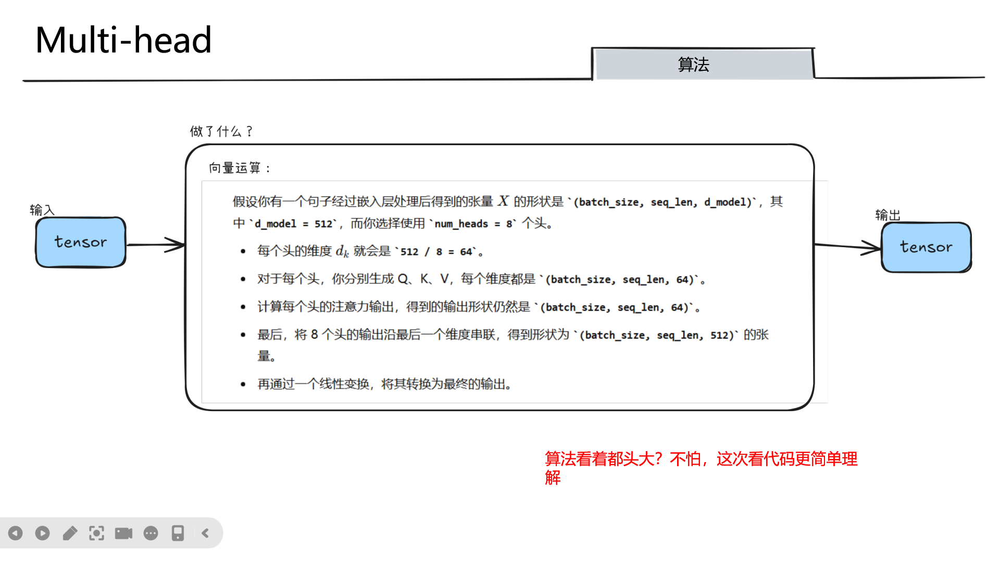

In [14]:
import torch
import torch.nn.functional as F

# 模拟输入张量：batch_size=1, seq_len=3, d_model=6
input_tensor = torch.tensor([[[0.1, 0.2, 0.3, 0.4, 0.5, 0.6],
                              [0.7, 0.8, 0.9, 1.0, 1.1, 1.2],
                              [1.3, 1.4, 1.5, 1.6, 1.7, 1.8]]])

# 定义模型参数
d_model = 6   # 输入嵌入维度
num_heads = 2 # 头的数量
d_k = d_model // num_heads  # 每个头的维度

# 初始化权重矩阵，形状为 (d_model, num_heads * d_k)
W_Q = torch.rand((d_model, num_heads * d_k))
W_K = torch.rand((d_model, num_heads * d_k))
W_V = torch.rand((d_model, num_heads * d_k))

# 1. 线性变换并直接分配到多个头
Q = torch.matmul(input_tensor, W_Q)  # (1, 3, 6) x (6, 6) -> (1, 3, 6)
K = torch.matmul(input_tensor, W_K)  # (1, 3, 6) x (6, 6) -> (1, 3, 6)
V = torch.matmul(input_tensor, W_V)  # (1, 3, 6) x (6, 6) -> (1, 3, 6)

# 将 Q, K, V 的形状从 (batch_size, seq_len, num_heads * d_k)
# 重塑为 (batch_size, num_heads, seq_len, d_k)
Q = Q.view(1, 3, num_heads, d_k).transpose(1, 2)  # -> (1, 2, 3, 3)
K = K.view(1, 3, num_heads, d_k).transpose(1, 2)  # -> (1, 2, 3, 3)
V = V.view(1, 3, num_heads, d_k).transpose(1, 2)  # -> (1, 2, 3, 3)

# 2. 计算每个头的注意力
scores = torch.matmul(Q, K.transpose(-2, -1)) / torch.sqrt(torch.tensor(d_k, dtype=torch.float32))  # (1, 2, 3, 3)

# 对得分应用 softmax
attention_weights = F.softmax(scores, dim=-1)  # (1, 2, 3, 3)

# 将注意力权重与 V 相乘，得到每个头的输出
output_heads = torch.matmul(attention_weights, V)  # (1, 2, 3, 3)

# 3. 将多个头的输出串联起来
output_heads_concat = output_heads.transpose(1, 2).contiguous().view(1, 3, d_model)  # -> (1, 3, 6)

# 4. 最终的线性变换
W_O = torch.rand((d_model, d_model))
output = torch.matmul(output_heads_concat, W_O)  # (1, 3, 6) x (6, 6) -> (1, 3, 6)

print("输入张量:\n", input_tensor)
print("Q矩阵:\n", Q)
print("K矩阵:\n", K)
print("V矩阵:\n", V)
print("注意力得分:\n", scores)
print("注意力权重:\n", attention_weights)
print("每个头的输出:\n", output_heads)
print("串联后的输出:\n", output_heads_concat)
print("最终输出:\n", output)


输入张量:
 tensor([[[0.1000, 0.2000, 0.3000, 0.4000, 0.5000, 0.6000],
         [0.7000, 0.8000, 0.9000, 1.0000, 1.1000, 1.2000],
         [1.3000, 1.4000, 1.5000, 1.6000, 1.7000, 1.8000]]])
Q矩阵:
 tensor([[[[1.2045, 0.9280, 1.0466],
          [3.4309, 2.8453, 2.9629],
          [5.6573, 4.7626, 4.8792]],

         [[1.0852, 1.1716, 1.4918],
          [3.0503, 3.1784, 3.7254],
          [5.0154, 5.1852, 5.9590]]]])
K矩阵:
 tensor([[[[1.4648, 0.9898, 1.0883],
          [4.0238, 2.5887, 3.0040],
          [6.5828, 4.1877, 4.9197]],

         [[0.6611, 0.7990, 1.5707],
          [1.6695, 2.1811, 3.8393],
          [2.6779, 3.5632, 6.1078]]]])
V矩阵:
 tensor([[[[0.7712, 0.9419, 0.8190],
          [2.2249, 2.9095, 2.4853],
          [3.6787, 4.8772, 4.1517]],

         [[1.1013, 1.1665, 0.6340],
          [2.8960, 3.2939, 2.0290],
          [4.6907, 5.4214, 3.4240]]]])
注意力得分:
 tensor([[[[ 2.2066,  6.0003,  9.7941],
          [ 6.3892, 17.3618, 28.3344],
          [10.5719, 28.7233, 46.8747]],

      

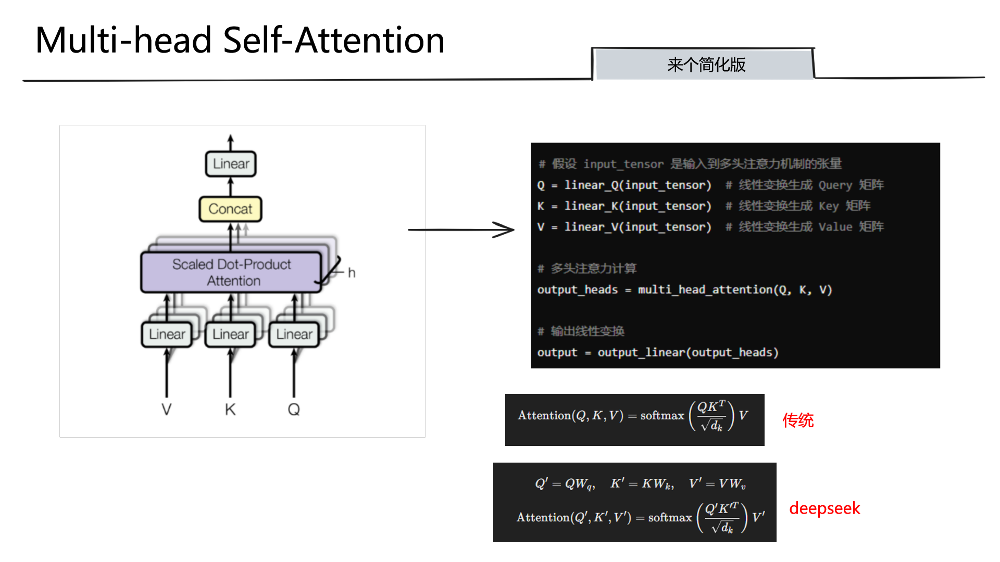

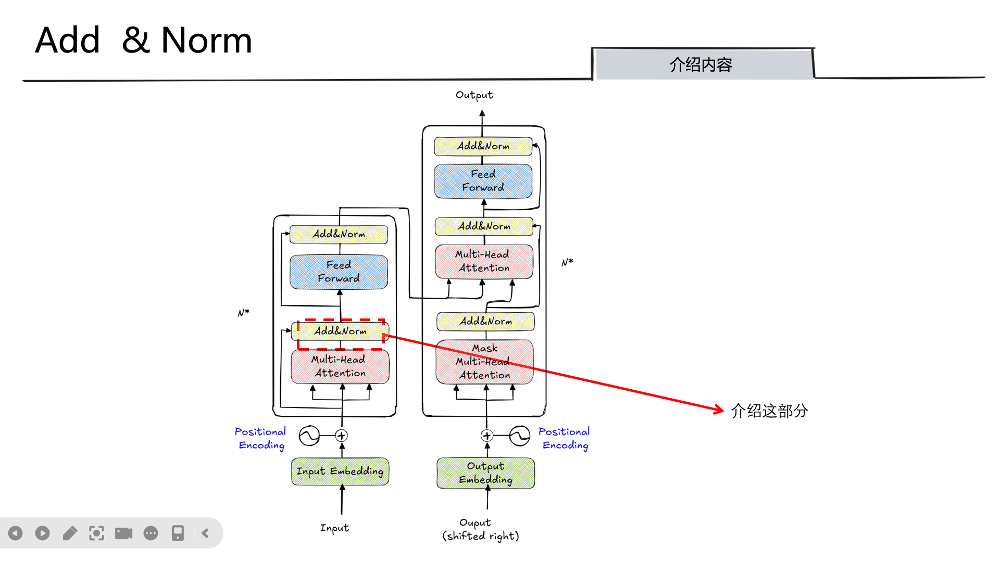

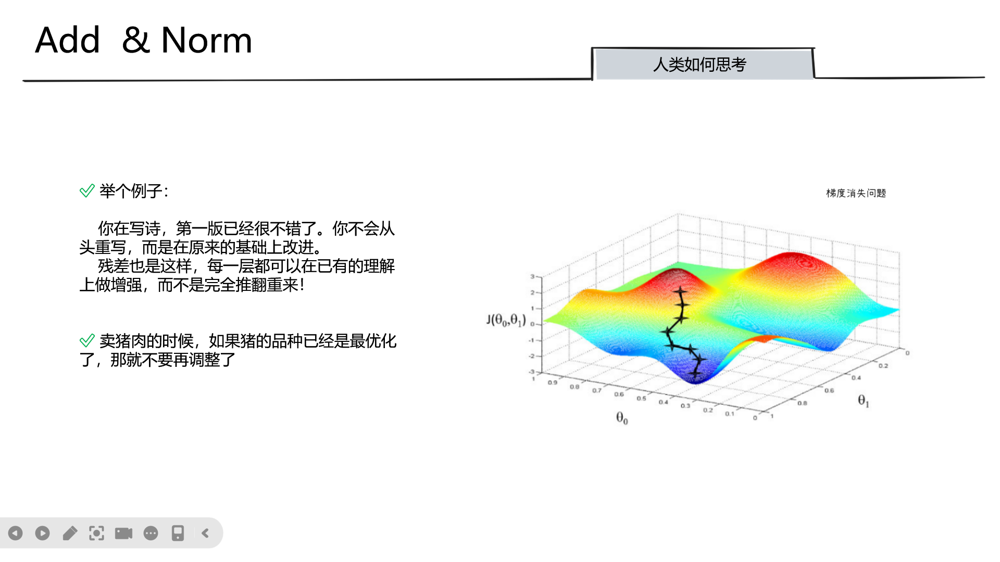

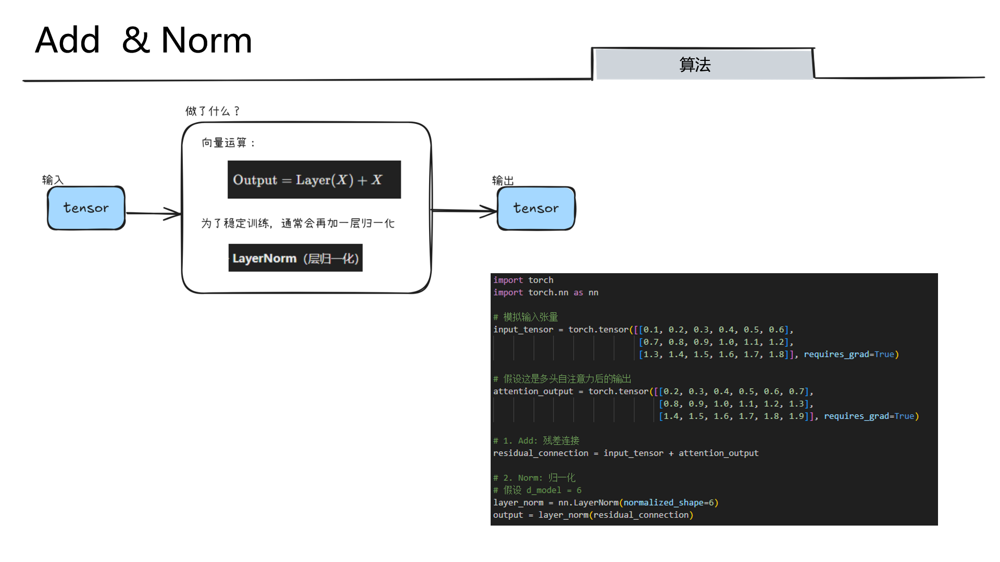

In [15]:
import torch
import torch.nn as nn

# 模拟输入张量
input_tensor = torch.tensor([[0.1, 0.2, 0.3, 0.4, 0.5, 0.6],
                             [0.7, 0.8, 0.9, 1.0, 1.1, 1.2],
                             [1.3, 1.4, 1.5, 1.6, 1.7, 1.8]], requires_grad=True)

# 假设这是多头自注意力后的输出
attention_output = torch.tensor([[0.2, 0.3, 0.4, 0.5, 0.6, 0.7],
                                 [0.8, 0.9, 1.0, 1.1, 1.2, 1.3],
                                 [1.4, 1.5, 1.6, 1.7, 1.8, 1.9]], requires_grad=True)

# 1. Add: 残差连接
residual_connection = input_tensor + attention_output

# 2. Norm: 归一化
# 假设 d_model = 6
layer_norm = nn.LayerNorm(normalized_shape=6)
output = layer_norm(residual_connection)

print("输入张量:\n", input_tensor)
print("多头注意力输出:\n", attention_output)
print("残差连接结果:\n", residual_connection)
print("归一化后输出:\n", output)


输入张量:
 tensor([[0.1000, 0.2000, 0.3000, 0.4000, 0.5000, 0.6000],
        [0.7000, 0.8000, 0.9000, 1.0000, 1.1000, 1.2000],
        [1.3000, 1.4000, 1.5000, 1.6000, 1.7000, 1.8000]], requires_grad=True)
多头注意力输出:
 tensor([[0.2000, 0.3000, 0.4000, 0.5000, 0.6000, 0.7000],
        [0.8000, 0.9000, 1.0000, 1.1000, 1.2000, 1.3000],
        [1.4000, 1.5000, 1.6000, 1.7000, 1.8000, 1.9000]], requires_grad=True)
残差连接结果:
 tensor([[0.3000, 0.5000, 0.7000, 0.9000, 1.1000, 1.3000],
        [1.5000, 1.7000, 1.9000, 2.1000, 2.3000, 2.5000],
        [2.7000, 2.9000, 3.1000, 3.3000, 3.5000, 3.7000]],
       grad_fn=<AddBackward0>)
归一化后输出:
 tensor([[-1.4638, -0.8783, -0.2928,  0.2928,  0.8783,  1.4638],
        [-1.4638, -0.8783, -0.2928,  0.2928,  0.8783,  1.4638],
        [-1.4638, -0.8783, -0.2928,  0.2928,  0.8783,  1.4638]],
       grad_fn=<NativeLayerNormBackward0>)


你可以把残差公式看作：

$$Output = x + F(x)$$

其中 $x$ 是输入，$F(x)$ 是这一层的复杂运算（比如 Self-Attention）。

- **如果这一层是有用的：** 模型会通过反向传播调整 $F(x)$ 内部的权重，使得 $F(x)$ 输出有意义的特征。
    
- **如果这一层是多余的（或者有害的）：** 梯度下降会引导 $F(x)$ 内部的权重趋向于 **0**。
    
    - 当 $F(x) \approx 0$ 时，$Output \approx x + 0$。
        
    - 这时，信号就好像“跳过”了这一层的逻辑运算，直接把原始输入传到了下一层。
        

**所以：** 模型不是通过“逻辑判断”来跳过，而是通过**把这一层的权重训练成“不作为”**，从而实现逻辑上的跳过。

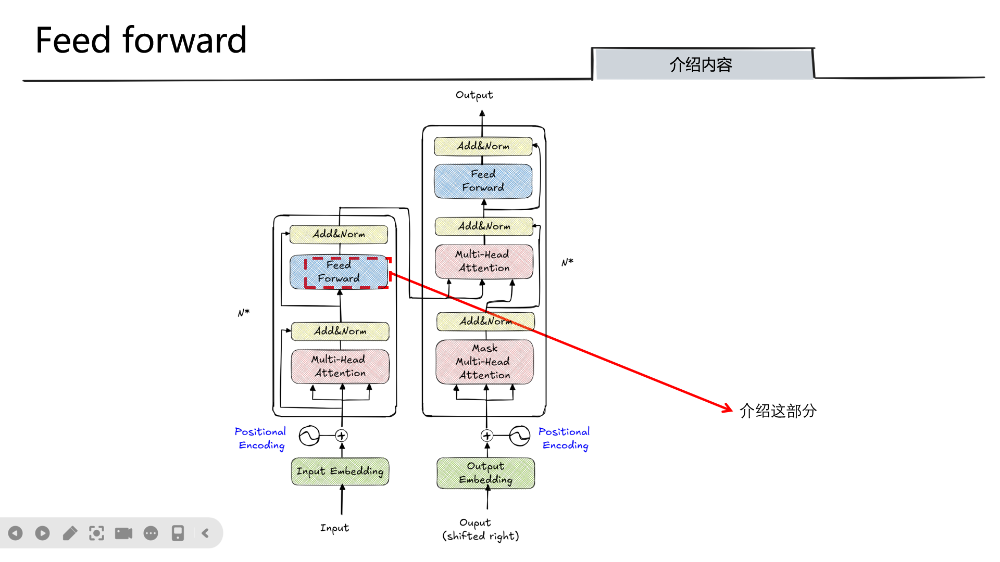

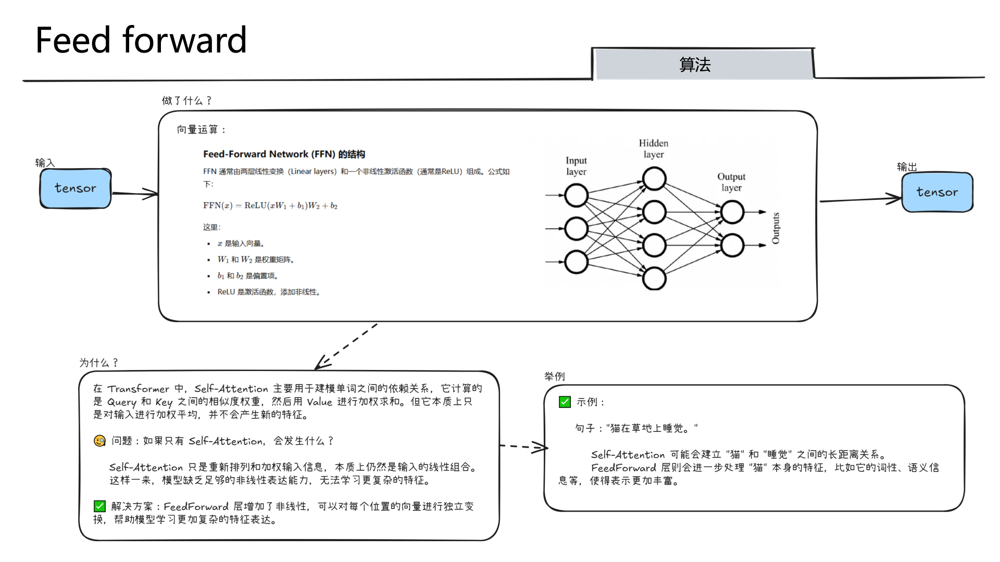

##linear的魅力，把1+1=2，变成了1+1大概率等于2

### 1. 从“硬编码”到“学习参数”

在传统编程里，$1 + 1 = 2$ 是死板的逻辑（Hard-coded）。但在神经网络的 Linear 层中，运算其实是 $y = wx + b$。

- **初始状态：** 刚开始权重 $w$ 是随机的，$1 + 1$ 可能等于 $0.57$。
    
- **学习过程：** 神经网络通过看到大量的例子，不断调整 $w$ 和 $b$。
    
- **魅力所在：** 它不是被“告知” $1 + 1 = 2$，而是通过数据**推断**出 $1 + 1$ 应该趋近于 $2$。所以你说“大概率等于 2”非常准确，因为它本质上是在做一种**统计意义上的拟合**。
    

---

### 2. 容错性与“模糊处理”

这就是你说的“大概率”最迷人的地方。

- **传统逻辑：** 如果输入变成了 $1.000001 + 1$，传统逻辑可能会报错或者需要专门的处理逻辑。
    
- **Linear 层：** 因为它是基于权重的连续运算，它会告诉你结果大概是 $2.000001$。
    
- **魅力所在：** 这种“大概率等于 2”赋予了神经网络**鲁棒性（Robustness）**。即使输入有噪音、有缺失，它也能凭借学习到的“大概规律”，给出一个最接近真相的答案。
    

---

### 3. 需要稍微修正的一点：Linear 并不是全部

虽然你感悟到了 Linear 的魅力，但要让 $1+1$ 真正产生智能，光有 Linear 是不够的：

- **线性叠加还是线性：** 如果只有 Linear 层，无论你堆叠多少层，它们最终还是一个巨大的 $1+1=2$。
    
- **激活函数（Activation Function）才是灵魂：** 必须配合像 ReLU 这样的非线性激活函数，神经网络才能模拟复杂的逻辑。
    
- **真相：** Linear 负责**旋转和缩放空间**（把数据整理好），而非线性层负责**弯曲空间**（分类和决策）。

In [16]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class FeedForwardNetwork(nn.Module):
    def __init__(self, d_model, d_ff):
        super(FeedForwardNetwork, self).__init__()
        # 第一层线性变换，输出维度为 d_ff
        self.linear1 = nn.Linear(d_model, d_ff)
        # 第二层线性变换，输出维度为 d_model（恢复原始维度）
        self.linear2 = nn.Linear(d_ff, d_model)

    def forward(self, x):
        # ReLU 非线性激活
        x = F.relu(self.linear1(x))
        # 第二次线性变换
        x = self.linear2(x)
        return x

# 假设输入张量
input_tensor = torch.rand(2, 3, 512)  # (batch_size=2, seq_len=3, d_model=512)

# 定义 Feed-Forward 网络，d_ff 通常大于 d_model，例如 2048
ffn = FeedForwardNetwork(d_model=512, d_ff=2048)

# 前向传播
output = ffn(input_tensor)

print("输入张量:\n", input_tensor)
print("输出张量:\n", output)


输入张量:
 tensor([[[0.1729, 0.9363, 0.6769,  ..., 0.0914, 0.5188, 0.2067],
         [0.9111, 0.0195, 0.7234,  ..., 0.6210, 0.1447, 0.1023],
         [0.0190, 0.5279, 0.8105,  ..., 0.9800, 0.5757, 0.0468]],

        [[0.8569, 0.5458, 0.5099,  ..., 0.1774, 0.5381, 0.3882],
         [0.1731, 0.3405, 0.1157,  ..., 0.2823, 0.9286, 0.8440],
         [0.9570, 0.0154, 0.5056,  ..., 0.2542, 0.6117, 0.8235]]])
输出张量:
 tensor([[[ 0.0939,  0.2310,  0.0414,  ..., -0.1320,  0.2132, -0.1081],
         [ 0.1879,  0.1718,  0.0938,  ..., -0.1129,  0.2046, -0.0638],
         [ 0.1775,  0.2214,  0.0404,  ..., -0.1579,  0.2599, -0.1517]],

        [[ 0.1837,  0.1924,  0.0857,  ..., -0.1422,  0.1762, -0.1026],
         [ 0.2448,  0.2718, -0.0420,  ...,  0.0190,  0.2153, -0.0634],
         [ 0.1715,  0.1563,  0.0452,  ..., -0.1034,  0.2414, -0.1014]]],
       grad_fn=<ViewBackward0>)


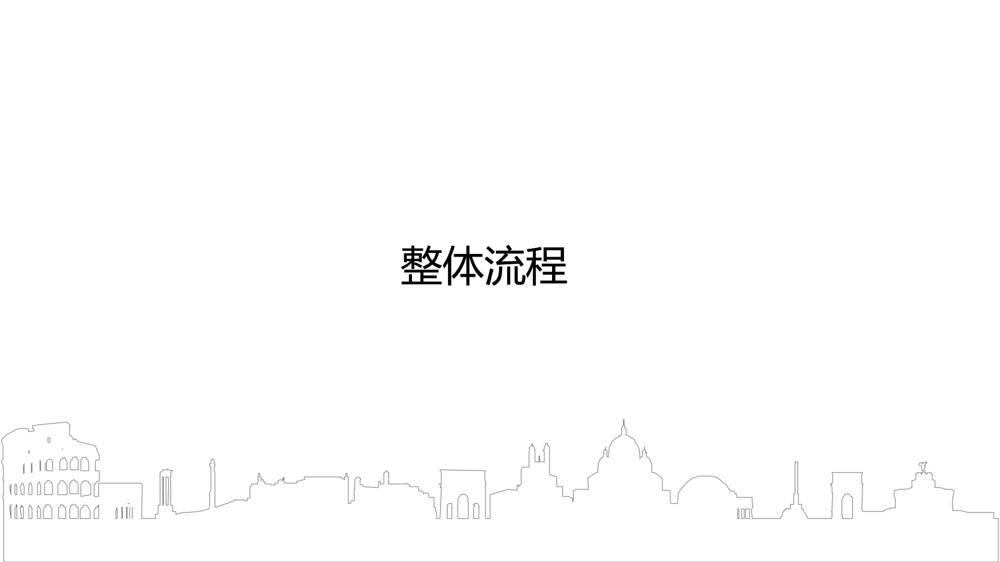

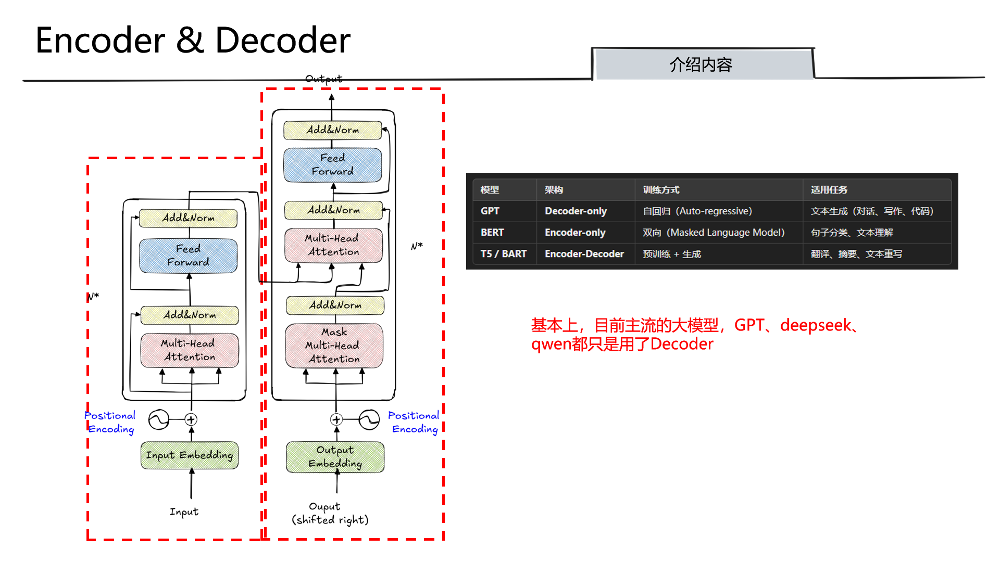

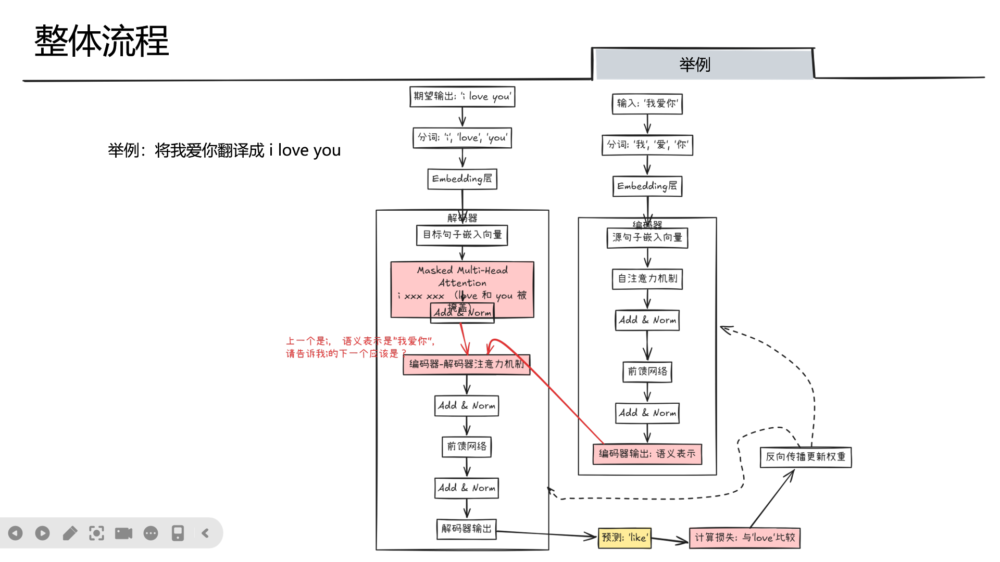

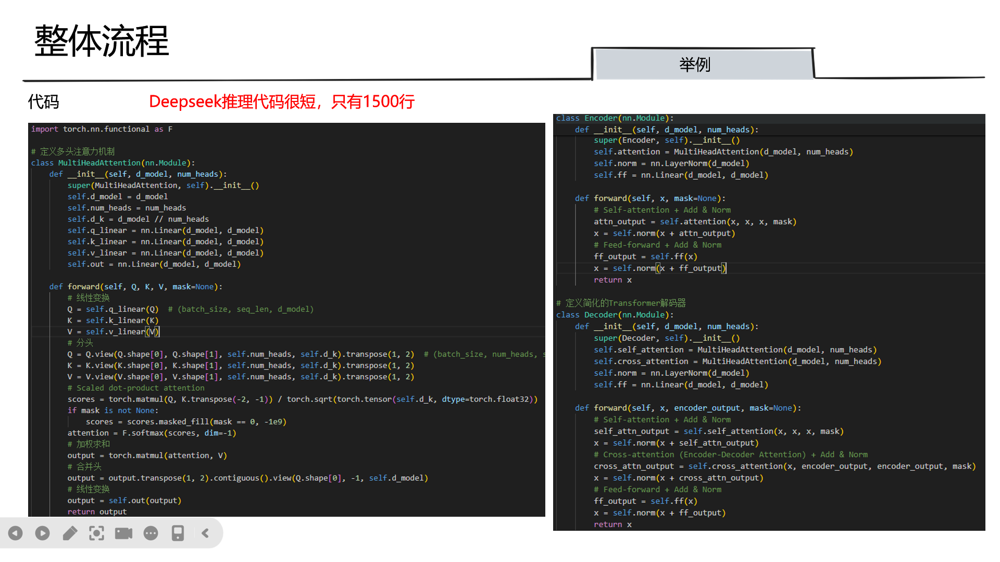

In [17]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# 定义多头注意力机制
class MultiHeadAttention(nn.Module):
    def __init__(self, d_model, num_heads):
        super(MultiHeadAttention, self).__init__()
        self.d_model = d_model
        self.num_heads = num_heads
        self.d_k = d_model // num_heads
        self.q_linear = nn.Linear(d_model, d_model)
        self.k_linear = nn.Linear(d_model, d_model)
        self.v_linear = nn.Linear(d_model, d_model)
        self.out = nn.Linear(d_model, d_model)

    def forward(self, Q, K, V, mask=None):
        # 线性变换
        Q = self.q_linear(Q)  # (batch_size, seq_len, d_model)
        K = self.k_linear(K)
        V = self.v_linear(V)
        # 分头
        Q = Q.view(Q.shape[0], Q.shape[1], self.num_heads, self.d_k).transpose(1, 2)  # (batch_size, num_heads, seq_len, d_k)
        K = K.view(K.shape[0], K.shape[1], self.num_heads, self.d_k).transpose(1, 2)
        V = V.view(V.shape[0], V.shape[1], self.num_heads, self.d_k).transpose(1, 2)
        # Scaled dot-product attention
        scores = torch.matmul(Q, K.transpose(-2, -1)) / torch.sqrt(torch.tensor(self.d_k, dtype=torch.float32))
        if mask is not None:
            scores = scores.masked_fill(mask == 0, -1e9)
        attention = F.softmax(scores, dim=-1)
        # 加权求和
        output = torch.matmul(attention, V)
        # 合并头
        output = output.transpose(1, 2).contiguous().view(Q.shape[0], -1, self.d_model)
        # 线性变换
        output = self.out(output)
        return output

# 定义简化的Transformer编码器
class Encoder(nn.Module):
    def __init__(self, d_model, num_heads):
        super(Encoder, self).__init__()
        self.attention = MultiHeadAttention(d_model, num_heads)
        self.norm = nn.LayerNorm(d_model)
        self.ff = nn.Linear(d_model, d_model)

    def forward(self, x, mask=None):
        # Self-attention + Add & Norm
        attn_output = self.attention(x, x, x, mask)
        x = self.norm(x + attn_output)
        # Feed-forward + Add & Norm
        ff_output = self.ff(x)
        x = self.norm(x + ff_output)
        return x

# 定义简化的Transformer解码器
class Decoder(nn.Module):
    def __init__(self, d_model, num_heads):
        super(Decoder, self).__init__()
        self.self_attention = MultiHeadAttention(d_model, num_heads)
        self.cross_attention = MultiHeadAttention(d_model, num_heads)
        self.norm = nn.LayerNorm(d_model)
        self.ff = nn.Linear(d_model, d_model)

    def forward(self, x, encoder_output, mask=None):
        # Self-attention + Add & Norm
        self_attn_output = self.self_attention(x, x, x, mask)
        x = self.norm(x + self_attn_output)
        # Cross-attention (Encoder-Decoder Attention) + Add & Norm
        cross_attn_output = self.cross_attention(x, encoder_output, encoder_output, mask)
        x = self.norm(x + cross_attn_output)
        # Feed-forward + Add & Norm
        ff_output = self.ff(x)
        x = self.norm(x + ff_output)
        return x

# 示例数据
source_sentence = "我爱你"  # 中文句子
target_sentence = "I love you"  # 英文句子

# 假设我们有一个简单的词嵌入表示（仅用于演示）
source_embeddings = torch.tensor([[0.1, 0.2, 0.3],  # "我"
                                  [0.4, 0.5, 0.6],  # "爱"
                                  [0.7, 0.8, 0.9]])  # "你"

target_embeddings = torch.tensor([[0.9, 0.8, 0.7],  # "I"
                                  [0.6, 0.5, 0.4],  # "love"
                                  [0.3, 0.2, 0.1]])  # "you"

# 初始化模型
d_model = 3  # 模型维度（为简化，假设为3）
num_heads = 1  # 假设使用单头注意力（为简化）

encoder = Encoder(d_model, num_heads)
decoder = Decoder(d_model, num_heads)

# 模拟编码器的输出
encoder_output = encoder(source_embeddings.unsqueeze(0))

# 模拟解码器的输入（目标序列的嵌入表示）
decoder_input = target_embeddings.unsqueeze(0)

# 通过解码器
decoder_output = decoder(decoder_input, encoder_output)

# 打印结果
print("编码器的输出：", encoder_output)
print("解码器的输出：", decoder_output)


编码器的输出： tensor([[[ 0.2970, -1.3459,  1.0489],
         [ 0.2984, -1.3464,  1.0479],
         [ 0.2998, -1.3468,  1.0470]]], grad_fn=<NativeLayerNormBackward0>)
解码器的输出： tensor([[[-0.1820,  1.3055, -1.1236],
         [-0.1820,  1.3056, -1.1236],
         [-0.1820,  1.3056, -1.1235]]], grad_fn=<NativeLayerNormBackward0>)
